<a href="https://colab.research.google.com/github/pratikshamishra2306/Dog_Breed_Identification/blob/main/dogbreedidentification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.


## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed pf each test image.


## 4. Features

Some information about the data:
* We're dealing with the images (unstructured data), so it's probably best we use deep learning/ transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes)
* There are around 10,000+ images in the trainings set (these images have labels)
* There are around 10000+ images in the test set (these images have no labels, because we'll want to predict them).

In [ ]:
!unzip /content/drive/MyDrive/dog-breed-identification.zip

Archive:  /content/drive/MyDrive/dog-breed-identification.zip
replace labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.10.0
TF Hub version: 0.12.0
GPU not available


In [ ]:
pip install tensorflow==2.10.0 tensorflow-hub==0.12.0


In [ ]:
# Getting our data ready (turning it into sensors)
# The data has to be in numeric format

# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

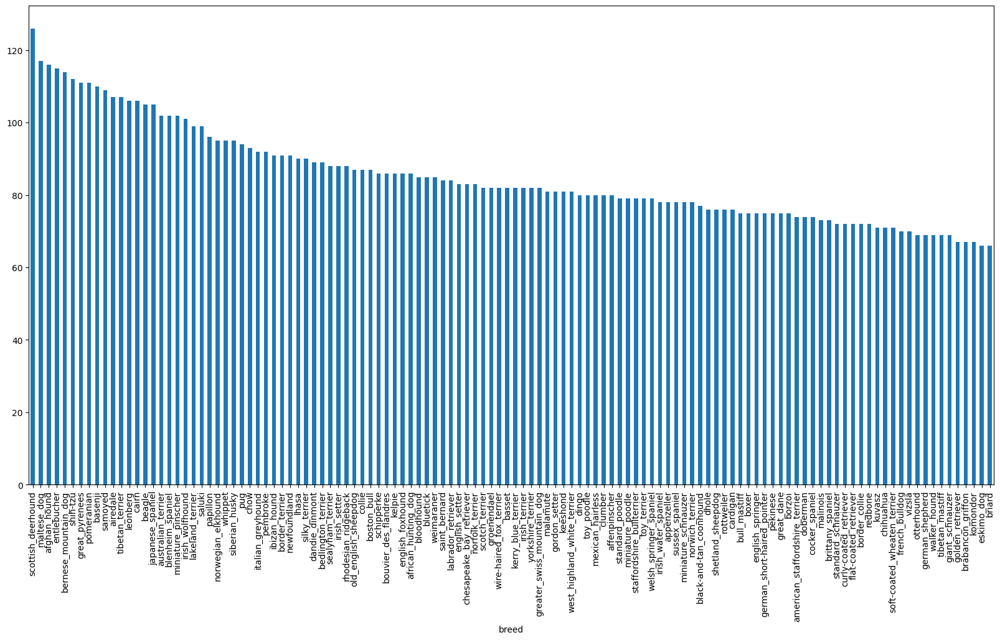

In [ ]:
# How many images are there of each breed

labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()
# We have 82 images per class

82.0

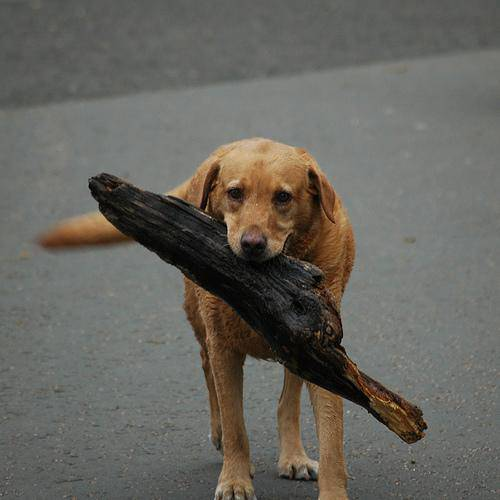

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

In [ ]:
# Getting images and their labels

labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ["/content/train/" + fname + ".jpg"for fname in labels_csv["id"] ]
# Check the first 10
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether the number of filenames matches number of actual image files
import os
if len(os.listdir("/content/train")) == len(filenames):
  print("Filenames match actual amount of files, Proceed!")
else:
  print("Filenames do not match actual amount of files, check the directory")

Filenames match actual amount of files, Proceed!


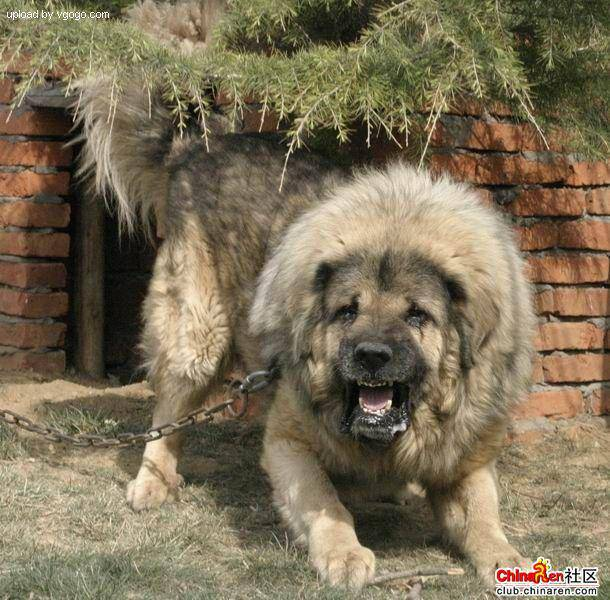

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since, we've got our training image filepaths in a list, let's prepare our labels


In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thinga s above
labels, len(labels)

(array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
        'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object),
 10222)

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 in the index where the label occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

We're going to start off experiment with 1000 images and increase as needed

In [ ]:
# Set the number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [ ]:
# Let's split our data into train and validation
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                    y[:NUM_IMAGES],
                                                    test_size=0.2,
                                                    random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, F

## Preprocessing images (turning images into tensors)

To preprocess our iamges into Tensors, we're going to write a function which does a few things

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a a variable , 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1).
5. Resize the 'iamge' to be a hape of (224, 224)
6. Return the modified image

In [ ]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
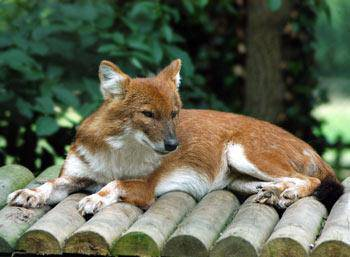

In [ ]:
image

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
image.max(), image.min()

(255, 0)

Now, we've seen, what an image looks like as a tensor, let's amke a function to preprocess them

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue
  image = tf.image.decode_jpeg(image, channels=3)

  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to our desired size (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10000+ images in one go, they all might not fit into the memory, which is why we do about 32 (this is the batch size) images at one time, the batch size can be manually adjusted at any time.

In order to use TensorFlow effectively, we need our data in the form of Tensor Tuples

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42]) , y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into Tuples of Tensors in the form: '(image, label)', let's make a function to turn all of our data ('X' & 'y') into batches

In [ ]:
# Define batch size
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (NO LABELS)
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tuples
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than  shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out different attricbutes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.4382933 , 0.47358742, 0.25987944],
          [0.5283246 , 0.5636188 , 0.34991077],
          [0.5216026 , 0.5568967 , 0.3431887 ],
          ...,
          [0.45982572, 0.535714  , 0.27630478],
          [0.5834139 , 0.6661169 , 0.3642075 ],
          [0.47096834, 0.5572429 , 0.22885886]],
 
         [[0.5481196 , 0.5804463 , 0.39040774],
          [0.56979805, 0.60212475, 0.41208625],
          [0.5734141 , 0.6057408 , 0.41570225],
          ...,
          [0.4627393 , 0.53567815, 0.2926067 ],
          [0.5086679 , 0.58840346, 0.30397004],
          [0.4440206 , 0.52732766, 0.21579865]],
 
         [[0.49913827, 0.5255651 , 0.3649558 ],
          [0.68338805, 0.70981485, 0.5492056 ],
          [0.6059679 , 0.63239473, 0.47178546],
          ...,
          [0.5049248 , 0.5734821 , 0.34607914],
          [0.5267133 , 0.604212  , 0.33546317],
          [0.46326157, 0.54371077, 0.25561535]],
 
         ...,
 
         [[0.60631   , 0.6101481 , 0.42375538],
          [0.49513

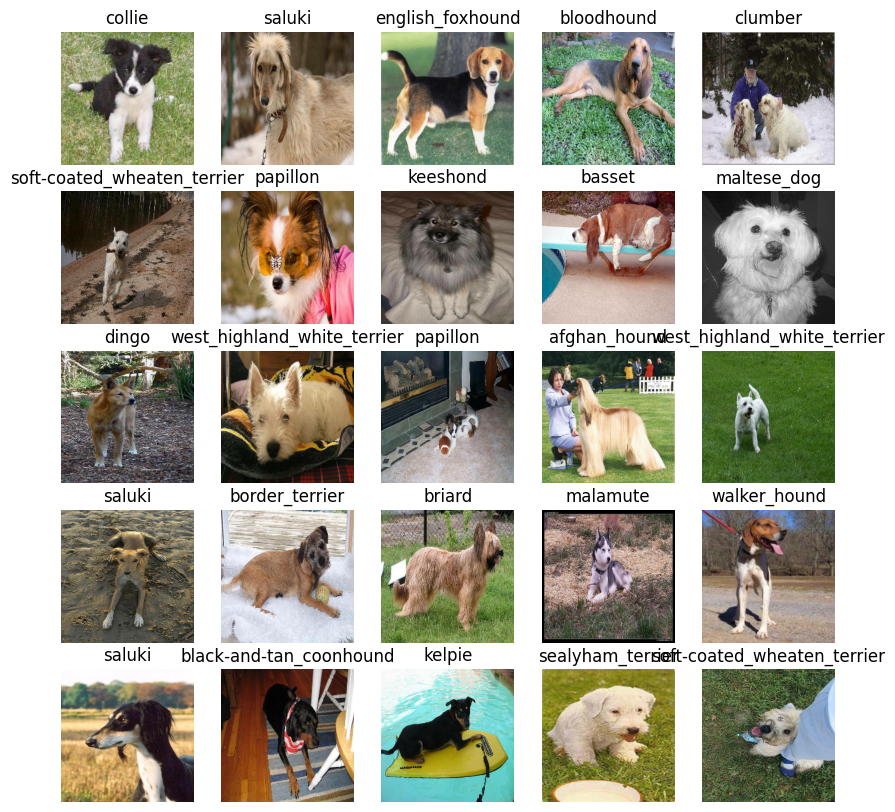

In [ ]:
# Now, let's visualize the data in a training batch
#train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

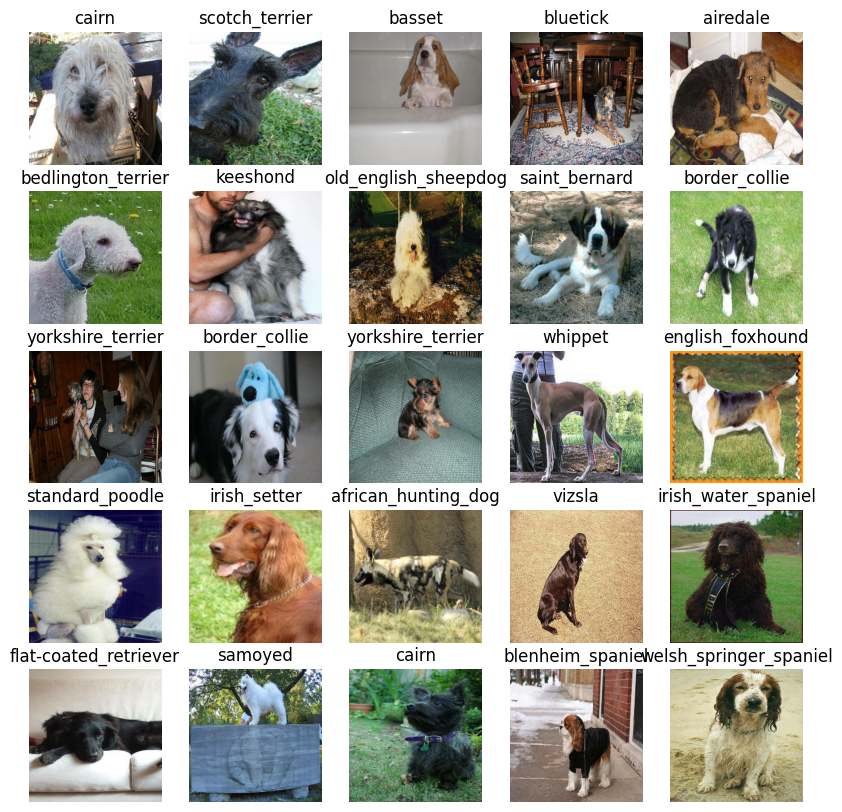

In [ ]:
# Now let's visualize our validation data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# Building a model
# Setup input shape to the model

INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer_)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

Now we've got our input, outputs and model ready to go. Let's put them together into a Keras deep learning model.

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training do to such things as save it's progress, check it;s progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our model's progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function
3. Visualize our model's training logs with the %tensorboard magic function (we'll do this after model training)


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("content/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

- Helps stop our model from overfitting by stopping training if a certain evaluation metric stops

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                   patience=3)

### Training a model (on subset of data)

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}
NUM_EPOCHS

100

In [ ]:
# Check to make sure we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU not available


Let's create a function which trains a model

* Create a model using 'create_model()'
* Setup a TensorBoard callback using 'create_tensorboard_callback()'
* Call the 'fit()' function on our model passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS') and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 95s 3s/step - loss: 4.6070 - accuracy: 0.1187 - val_loss: 3.4061 - val_accuracy: 0.2400
Epoch 2/100
25/25 [==============================] - 78s 3s/step - loss: 1.6765 - accuracy: 0.6725 - val_loss: 2.1532 - val_accuracy: 0.5050
Epoch 3/100
25/25 [==============================] - 74s 3s/step - loss: 0.5982 - accuracy: 0.9250 - val_loss: 1.6561 - val_accuracy: 0.6400
Epoch 4/100
25/25 [==============================] - 82s 3s/step - loss: 0.2660 - accuracy: 0.9887 - val_loss: 1.4837 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 78s 3s/step - loss: 0.1533 - accuracy: 0.9937 - val_loss: 1.3980 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 71s 3s/step - loss: 0.1037 - accuracy: 0.9987 - val_loss: 1.3539 - val_accuracy: 0.6800
Epoch 7/100
25/25 [==============================] - 76s 3s/s

### Checking the TensorBoard log

The TensorBoard magic function '(%tensorboard) will access the logs directly we created earlier and visualize it's contents

In [ ]:
%tensorboard --logdir content/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)

7/7 [==============================] - 20s 3s/step


In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
predictions[0], len(predictions[0])

(array([1.23013835e-03, 3.68543842e-04, 1.15216151e-03, 1.56970127e-04,
        3.04831570e-04, 1.96529800e-05, 1.85437258e-02, 6.54639734e-04,
        4.58912436e-05, 1.08333297e-04, 1.39344760e-04, 8.99112129e-05,
        1.34822004e-03, 1.26898682e-04, 4.81277471e-04, 6.48113142e-04,
        1.41792361e-05, 5.01293004e-01, 6.02127802e-05, 1.12452117e-05,
        2.40798062e-03, 6.70317459e-05, 2.06418063e-05, 5.80052787e-04,
        5.98302677e-06, 3.77136639e-05, 9.86564234e-02, 3.53436160e-04,
        3.27938207e-04, 1.44495309e-04, 5.13692466e-05, 3.76980053e-04,
        4.39921132e-04, 6.20883002e-05, 6.05353853e-05, 9.98327788e-03,
        6.61216836e-06, 5.89222938e-04, 8.42828813e-05, 5.48461649e-05,
        5.44787792e-04, 2.01168405e-06, 3.42533807e-04, 1.15561634e-04,
        4.88094374e-05, 2.73176673e-04, 1.90978884e-04, 4.05678613e-04,
        3.70999798e-04, 6.92657632e-05, 4.64688084e-04, 5.47893396e-05,
        2.60325556e-04, 1.56319747e-05, 9.59908939e-05, 1.695776

In [ ]:
# First Prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.48550767e-04 1.32216053e-04 2.64054343e-05 4.64354416e-05
 5.75099466e-03 9.58094679e-05 1.73147040e-04 2.99513852e-03
 4.33860766e-03 7.80229494e-02 3.79496341e-05 3.25370274e-05
 3.46520217e-04 4.60156798e-03 5.93028089e-04 2.23686313e-03
 7.83006908e-05 1.94380409e-04 6.76317955e-04 6.23362372e-04
 4.44168945e-05 7.64914847e-04 8.61045628e-05 1.62050965e-05
 1.31893968e-02 1.85647921e-04 7.33512934e-05 2.02311858e-04
 1.17608171e-04 8.02911891e-05 3.01708260e-05 1.68280632e-04
 5.02752409e-05 3.14474928e-05 1.16708972e-04 8.58221392e-05
 1.37392373e-04 1.39303345e-04 2.09492340e-04 1.02004558e-01
 2.89402873e-04 1.69280429e-05 9.36947577e-03 6.35024480e-06
 1.82489806e-04 5.43870410e-05 1.72944885e-04 6.49500871e-04
 4.75044944e-05 2.00017806e-04 3.72567622e-04 4.62303520e-04
 3.83830396e-04 1.13573775e-03 3.15943071e-05 1.39884045e-03
 1.02848076e-04 1.00083744e-04 8.21631111e-05 8.27526601e-05
 1.54105510e-04 9.86017520e-04 1.31448305e-05 1.74877987e-05
 2.04644166e-04 2.431359

In [ ]:
unique_breeds[113]

'walker_hound'

Note: Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)

def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batchset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth  labels)

In [ ]:
# Create a function to unbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color=color)

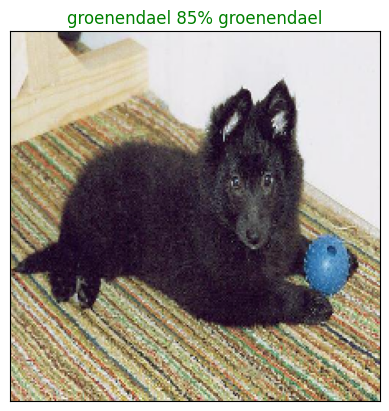

In [ ]:
plot_pred(predictions, val_labels, val_images, 77)

Now we've got one function to visualize our model's top prediction, let's make another to view our model's top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using 'get_pred_label()'
* Find the top 10:
 * Prediction probability indexes
 * Prediction probability values
 * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

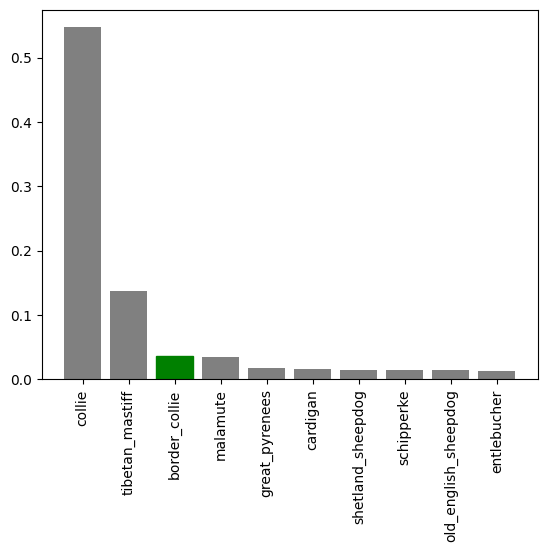

In [ ]:
plot_pred_conf(predictions, val_labels, 9)

Now we've got some functions to help us visualize our predictions and evaluate our model

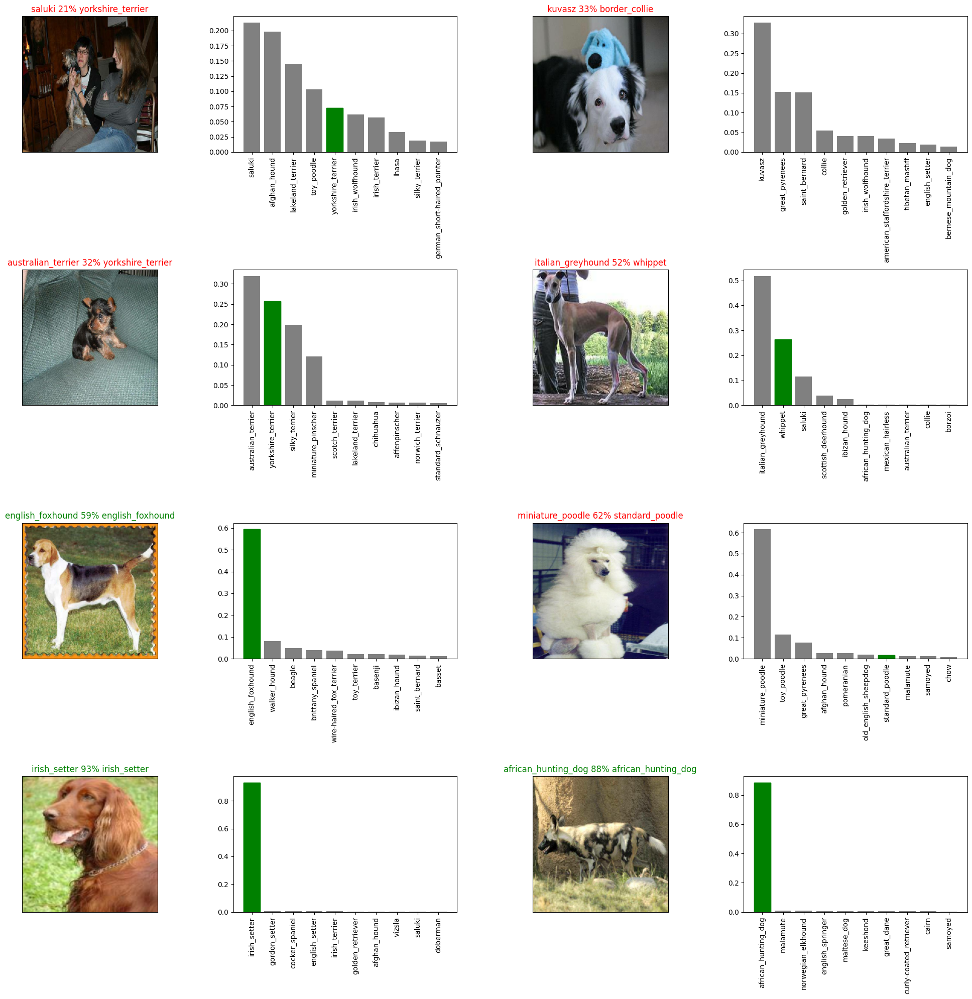

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 4
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

### Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity.
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("content/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # 'h5' is the save format of the model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: content/models/20240815-03091723691369-1000-images-mobilenetv2-Adam.h5...


'content/models/20240815-03091723691369-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('content/models/20240815-03091723691369-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: content/models/20240815-03091723691369-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 14s 2s/step - loss: 1.3118 - accuracy: 0.6800


[1.3118053674697876, 0.6800000071525574]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 17s 2s/step - loss: 1.3118 - accuracy: 0.6800


[1.3118053674697876, 0.6800000071525574]

### Training a model on the full dataset

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't monitor validation accuracy

# Create early stopping callback
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 761s 2s/step - loss: 0.0344 - accuracy: 0.9909
Epoch 2/100
320/320 [==============================] - 748s 2s/step - loss: 0.0424 - accuracy: 0.9877
Epoch 3/100
320/320 [==============================] - 730s 2s/step - loss: 0.0237 - accuracy: 0.9942
Epoch 4/100
320/320 [==============================] - 721s 2s/step - loss: 0.0121 - accuracy: 0.9982
Epoch 5/100
320/320 [==============================] - 721s 2s/step - loss: 0.0077 - accuracy: 0.9990
Epoch 6/100
320/320 [==============================] - 717s 2s/step - loss: 0.0073 - accuracy: 0.9991
Epoch 7/100
320/320 [==============================] - 715s 2s/step - loss: 0.0073 - accuracy: 0.9989
Epoch 8/100
320/320 [==============================] - 720s 2s/step - loss: 0.0091 - accuracy: 0.9985
Epoch 9/100
320/320 [==============================] - 714s 2s/step - loss: 0.0078 - accuracy: 0.9989


In [ ]:
save_model(full_model, suffix="full-dataset-mobilenetv2-Adam")

Saving model to: content/models/20240815-09561723715804-full-dataset-mobilenetv2-Adam.h5...


'content/models/20240815-09561723715804-full-dataset-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model('content/models/20240815-09561723715804-full-dataset-mobilenetv2-Adam.h5')

Loading saved model from: content/models/20240815-09561723715804-full-dataset-mobilenetv2-Adam.h5


## Making predictions in the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we will have to get into the same format

Luckily, we created 'create_data_batches()' earlier which can take a list of filenames as input and convert them into Tensor batches

To make predictions on the test data, we will:
* Get the test image filenames
* Convert the filenames into test data batches using 'create_date_batches()' and setting the 'test_data' parameter to 'True' (since the test data doesn't have labels)
* Make a predictions array by passing the test batches to the predict() method called on our model

In [ ]:
# Load test image filenames
test_path = "/content/test"
test_filenames = os.listdir("/content/test")
test_filenames = [test_path + "/" + f for f in test_filenames]
test_filenames[:10]

['/content/test/c8d481207a655be86fe49b2f09f9048e.jpg',
 '/content/test/27b7a4ba6f2000c3e91cb008f09b7cbf.jpg',
 '/content/test/52ec62fddcf5383dc26fd72fed304b24.jpg',
 '/content/test/2c24941301a096a60c294da2da380a8e.jpg',
 '/content/test/a81a9a46fcdf7adc8c60ef51471883f7.jpg',
 '/content/test/3a81b80e36c91964a3f01e5813a22a79.jpg',
 '/content/test/4cf0fcba95a9fbadc5a7ca4d7d01bbe7.jpg',
 '/content/test/06fb0df3d5a54b2f8f4d9295c0c6f4d5.jpg',
 '/content/test/d16f5acab90d41f1ac0014944027d490.jpg',
 '/content/test/0fa8b51dbcf4db355110909c624fb37f.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict() on our full model and passing it the test data batch will take a long time to run

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 733s 2s/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("content/test_predictions.csv", test_predictions, delimiter=",")


In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("content/test_predictions.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.90240880e-16, 7.30525130e-07, 1.72397388e-13, ...,
        7.60773111e-10, 3.84937082e-10, 1.54637917e-11],
       [7.92854826e-06, 2.40847675e-09, 1.64288423e-08, ...,
        1.78368686e-09, 6.79368384e-07, 1.49499000e-12],
       [1.70299241e-08, 2.05644204e-13, 2.92560843e-14, ...,
        6.18043949e-10, 3.07179082e-09, 5.20744322e-07],
       ...,
       [1.13689602e-07, 2.05415723e-04, 1.11437659e-08, ...,
        9.01184685e-05, 6.75921630e-09, 3.79416676e-09],
       [7.30797801e-12, 9.98746812e-01, 1.77178289e-11, ...,
        1.12893673e-07, 1.82658088e-13, 6.83100521e-11],
       [3.47564766e-15, 2.01492625e-11, 1.41960668e-15, ...,
        1.78342702e-15, 2.88607680e-08, 3.72078148e-16]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed

To get the data in this format, we will:
* Create a pandas DataFrame with and ID column as well as column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV and submit it to Kaggle

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c8d481207a655be86fe49b2f09f9048e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,27b7a4ba6f2000c3e91cb008f09b7cbf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,52ec62fddcf5383dc26fd72fed304b24,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2c24941301a096a60c294da2da380a8e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,a81a9a46fcdf7adc8c60ef51471883f7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,c8d481207a655be86fe49b2f09f9048e,5.902409e-16,7.305251e-07,1.723974e-13,2.436853e-09,5.670397e-11,2.777937e-11,2.755519e-12,1.704314e-14,7.282644e-07,...,1.493660e-10,5.695905e-14,2.813549e-04,8.937107e-10,3.849273e-11,5.488257e-08,5.865987e-13,7.607731e-10,3.849371e-10,1.546379e-11
1,27b7a4ba6f2000c3e91cb008f09b7cbf,7.928548e-06,2.408477e-09,1.642884e-08,8.416257e-06,1.913601e-10,1.488343e-10,3.497397e-08,5.044030e-11,4.759887e-15,...,6.870404e-07,1.890253e-11,6.044732e-09,2.505484e-10,6.039799e-09,6.045554e-19,1.167933e-13,1.783687e-09,6.793684e-07,1.494990e-12
2,52ec62fddcf5383dc26fd72fed304b24,1.702992e-08,2.056442e-13,2.925608e-14,5.134886e-07,1.939491e-09,1.636676e-13,3.963594e-13,5.935537e-17,3.264082e-14,...,3.650169e-08,4.140433e-10,4.637694e-13,1.655612e-13,1.992884e-12,9.890688e-08,9.636110e-10,6.180439e-10,3.071791e-09,5.207443e-07
3,2c24941301a096a60c294da2da380a8e,3.807344e-08,2.073569e-12,1.791998e-14,5.741646e-08,1.785210e-14,1.895016e-16,1.861257e-09,1.740505e-15,5.473476e-11,...,7.207882e-03,5.792830e-08,1.563821e-09,1.748337e-08,2.912380e-11,1.332597e-10,1.709607e-05,2.847722e-14,3.713304e-09,7.725148e-06
4,a81a9a46fcdf7adc8c60ef51471883f7,1.976508e-14,3.774590e-13,6.724368e-16,9.094852e-14,7.690087e-11,2.330838e-18,1.937478e-13,1.286805e-16,1.641501e-11,...,1.292541e-09,4.449053e-14,5.851762e-14,6.351056e-15,5.473595e-15,3.585278e-15,2.336397e-11,3.502773e-15,2.703483e-15,9.953530e-12


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("content/full_model_predictions_submission_1_mobilenetV2.csv", index=False)

In [ ]:
os.path.splitext(test_filenames[0])

('/content/test/c8d481207a655be86fe49b2f09f9048e', '.jpg')

### Making predictions on custom images

To make predictions on custom images, we will:
* Get the filepaths of our images
* Turn the filepaths into data batches using 'create_data_batches()'. And since our custom images won't have labels, we set the 'test_data' parameter to 'True'.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels
* Compare the predicted labels to the custom images


In [ ]:
# Get the custom image filepaths
#custom_path = "/content/content/dog_photos"
# custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_path = "/content/content/dog_photos/"
custom_image_paths = [os.path.join(custom_path, fname) for fname in os.listdir(custom_path) if os.path.isfile(os.path.join(custom_path, fname))]

In [ ]:
custom_image_paths

['/content/content/dog_photos/german-shepherd-3.jpeg',
 '/content/content/dog_photos/1000_F_13919417_QzASyOeL8UEhpmE3gUjV7cYdisWXqGc6.jpeg',
 '/content/content/dog_photos/Golden-Retriever.jpeg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 580ms/step


In [ ]:
custom_preds.shape

(3, 120)

In [ ]:
# Get custom iamge prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['german_shepherd', 'labrador_retriever', 'golden_retriever']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels, this can be fixed later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

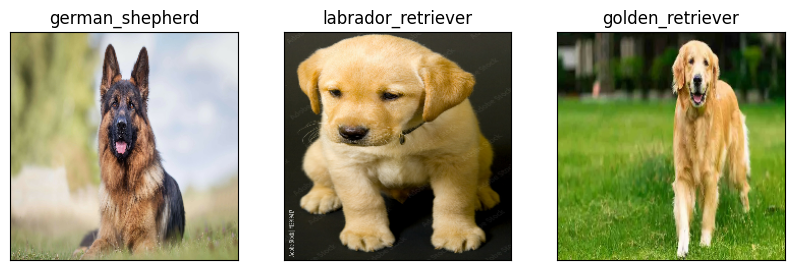

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)